# Convert to ONNX

In [ ]:
pip install onnx ultralytics --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.6/17.6 MB 72.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 42.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 97.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 71.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 30.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 37.5 MB/s eta 0:00:00


In [ ]:

pip install opencv-python onnxruntime --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.5/16.5 MB 77.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 5.7 MB/s eta 0:00:00


In [ ]:
import torch.onnx
from torch import nn
import cv2
import numpy as np
from ultralytics import YOLO

model = YOLO('./yolo-segmentation-weights.pt')

class_names = model.names

In [ ]:
input = './2_6by2.jpg'
img = cv2.imread(input)
input_size = (640, 640)
img_tensor = cv2.resize(img, input_size)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # YOLO expects RGB
img_tensor = img_tensor.transpose((2, 0, 1))  # HWC to CHW
img_tensor = np.expand_dims(img_tensor, axis=0)  # Add batch dimension
img_tensor = torch.tensor(img_tensor, dtype=torch.float32) / 255.0  # Normalize to [0, 1]
example_outputs = model.model(img_tensor)

In [ ]:
from ultralytics import YOLO

# Load the YOLO11 model
model = YOLO("yolo-segmentation-weights.pt")

# Export the model to ONNX format
model.export(format="onnx")  # creates 'yolo11n.onnx'

# Load the exported ONNX model
onnx_model = YOLO("yolo-segmentation-weights.onnx")

# Run inference
results = onnx_model("2_6by2.jpg")

# Inference

In [ ]:
# Install dependencies
!pip install onnxruntime opencv-python-headless --quiet

# Imports
import cv2
import numpy as np
import onnxruntime as ort


In [70]:
mode_path = "yolo-segmentation-weights.onnx"
onnx_model = ort.InferenceSession(mode_path)

classes = [i for i in range(13) ]

In [71]:
image = cv2.imread("2_6by2.jpg")

img_w, img_h = image.shape[1], image.shape[0]

img = cv2.resize(image, (640, 640))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = img.transpose(2, 0, 1)
img = img.reshape(1, 3, 640, 640)
# Normalize pixel values to the range [0, 1]
img = img / 255.0

# Convert image to float32
img = img.astype(np.float32)

In [72]:
outputs = onnx_model.run(None, {"images": img})

In [73]:
len(outputs[0][0][0])

8400

In [74]:
results = outputs[0][0]
results = results.transpose()
results.shape

(8400, 17)

In [75]:
def filter_Detections(results, thresh = 0.5):
    # if model is trained on 1 class only
    if len(results[0]) == 5:
        # filter out the detections with confidence > thresh
        considerable_detections = [detection for detection in results if detection[4] > thresh]
        considerable_detections = np.array(considerable_detections)
        return considerable_detections

    # if model is trained on multiple classes
    else:
        A = []
        for detection in results:

            class_id = detection[4:].argmax()
            confidence_score = detection[4:].max()

            new_detection = np.append(detection[:4],[class_id,confidence_score])

            A.append(new_detection)

        A = np.array(A)

        # filter out the detections with confidence > thresh
        considerable_detections = [detection for detection in A if detection[-1] > thresh]
        considerable_detections = np.array(considerable_detections)

        return considerable_detections

In [76]:
results = filter_Detections(results)

In [77]:
print(results.shape)

(134, 6)


In [78]:
def NMS(boxes, conf_scores, iou_thresh = 0.55):

    #  boxes [[x1,y1, x2,y2], [x1,y1, x2,y2], ...]

    x1 = boxes[:,0]
    y1 = boxes[:,1]
    x2 = boxes[:,2]
    y2 = boxes[:,3]

    areas = (x2-x1)*(y2-y1)

    order = conf_scores.argsort()

    keep = []
    keep_confidences = []

    while len(order) > 0:
        idx = order[-1]
        A = boxes[idx]
        conf = conf_scores[idx]

        order = order[:-1]

        xx1 = np.take(x1, indices= order)
        yy1 = np.take(y1, indices= order)
        xx2 = np.take(x2, indices= order)
        yy2 = np.take(y2, indices= order)

        keep.append(A)
        keep_confidences.append(conf)

        # iou = inter/union

        xx1 = np.maximum(x1[idx], xx1)
        yy1 = np.maximum(y1[idx], yy1)
        xx2 = np.minimum(x2[idx], xx2)
        yy2 = np.minimum(y2[idx], yy2)

        w = np.maximum(xx2-xx1, 0)
        h = np.maximum(yy2-yy1, 0)

        intersection = w*h

        # union = areaA + other_areas - intesection
        other_areas = np.take(areas, indices= order)
        union = areas[idx] + other_areas - intersection

        iou = intersection/union

        boleans = iou < iou_thresh

        order = order[boleans]

        # order = [2,0,1]  boleans = [True, False, True]
        # order = [2,1]

    return keep, keep_confidences



# function to rescale bounding boxes
def rescale_back(results,img_w,img_h):
    cx, cy, w, h, class_id, confidence = results[:,0], results[:,1], results[:,2], results[:,3], results[:,4], results[:,-1]
    cx = cx/640.0 * img_w
    cy = cy/640.0 * img_h
    w = w/640.0 * img_w
    h = h/640.0 * img_h
    x1 = cx - w/2
    y1 = cy - h/2
    x2 = cx + w/2
    y2 = cy + h/2

    boxes = np.column_stack((x1, y1, x2, y2, class_id))
    keep, keep_confidences = NMS(boxes,confidence)
    print(np.array(keep).shape)
    return keep, keep_confidences


In [79]:
rescaled_results, confidences = rescale_back(results, img_w, img_h)

(19, 5)


In [80]:
rescaled_results[0]

array([-1.00488281e+00,  3.38160744e+02,  2.22639392e+03,  5.01599761e+02,
        0.00000000e+00])

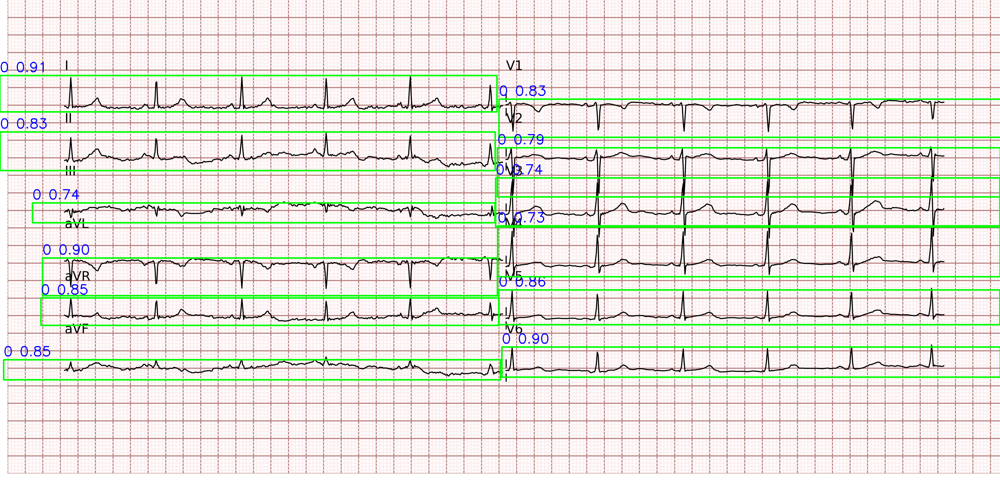

In [88]:
from google.colab.patches import cv2_imshow

img = image.copy()

for res, conf in zip(rescaled_results, confidences):
    x1,y1,x2,y2, cls_id = res
    cls_id = int(cls_id)
    if cls_id != 0:
        continue
    x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
    conf = "{:.2f}".format(conf)
    # draw the bounding boxes
    cv2.rectangle(img,(int(x1),int(y1)),(int(x2),int(y2)),(0,255, 0),5)
    cv2.putText(img,str(classes[cls_id]) + " " + str(conf),(x1,y1-17),
                cv2.FONT_HERSHEY_SIMPLEX,2,(255,0,0),3)

cv2.imwrite("Output.jpg", img)
cv2_imshow(img)